**Library Imports**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

**Data Loading**

In [4]:
SLIPPAGE_CSV = "slippage.csv"

#Load dataset
slippage_df = pd.read_csv(SLIPPAGE_CSV)

**Data Exploration and Overview**

In [6]:
print("##################### Shape #####################")
print(slippage_df.shape)
print("##################### Types #####################")
print(slippage_df.dtypes)
print("##################### Head #####################")
print(slippage_df.head())
print("##################### Tail #####################")
print(slippage_df.tail())
print("##################### NA #####################")
print(slippage_df.isnull().sum())


##################### Shape #####################
(2409499, 21)
##################### Types #####################
event_type_trade         object
event_time_trade          int64
agg_trade_id              int64
symbol_trade             object
trade_price             float64
trade_quantity          float64
first_trade_id            int64
last_trade_id             int64
trade_time_trade          int64
is_market_maker            bool
event_type_book          object
order_book_update_id    float64
symbol_book              object
bid_price               float64
bid_quantity            float64
ask_price               float64
ask_quantity            float64
trade_time_book         float64
event_time_book         float64
mid_price               float64
slippage_bps            float64
dtype: object
##################### Head #####################
  event_type_trade  event_time_trade  agg_trade_id symbol_trade  trade_price  \
0         aggTrade     1740689182135    2592130255      BTCUSDT      83

In [7]:
# Remove rows with missing values
slippage_df.dropna(inplace=True)

# Drop unnecessary columns
columns_to_drop = ["agg_trade_id", "event_type_trade", "event_type_book" ,"event_time_trade", "symbol_trade", "first_trade_id", 
                   "last_trade_id", "symbol_book","order_book_update_id","event_time_book"]
slippage_df.drop(columns=columns_to_drop, inplace=True)
slippage_df.head()

,trade_price,trade_quantity,trade_time_trade,is_market_maker,bid_price,bid_quantity,ask_price,ask_quantity,trade_time_book,mid_price,slippage_bps
1,83205.6,0.636,1740689182132,True,83205.6,5.263,83205.7,3.193,1.740689e+12,83205.65,-0.006009
2,83204.2,0.002,1740689182202,True,83204.1,0.008,83204.2,0.604,1.740689e+12,83204.15,0.006009
3,83204.1,0.006,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.246382
4,83203.6,0.006,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.186290
5,83203.3,0.003,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.150234


In [8]:
#  Piyasa Likiditesi (Bid-Ask Spread)
slippage_df["spread_bps"] = ((slippage_df["ask_price"] - slippage_df["bid_price"]) / slippage_df["mid_price"]) * 10000

#  Volatilite (Fiyat Dalgalanması - Rolling Std)
slippage_df["rolling_volatility"] = slippage_df["trade_price"].rolling(window=3).std()

#  İşlem Hacmi (Rolling Volume)
slippage_df["rolling_trade_volume"] = slippage_df["trade_quantity"].rolling(window=50).sum()

#  Tick Volume (İşlem Sayısı)
slippage_df["tick_volume"] = slippage_df.groupby("trade_time_trade")["trade_price"].transform("count")

#  Ortalama İşlem Büyüklüğü (Trade Size)
slippage_df["avg_trade_size"] = slippage_df["trade_quantity"].rolling(window=100, min_periods=1).mean()

# Remove rows with missing values
slippage_df.dropna(inplace=True)

In [9]:
# Convert time columns to datetime format
slippage_df['trade_time_trade'] = pd.to_datetime(slippage_df['trade_time_trade'], unit='ms')
slippage_df['trade_time_book'] = pd.to_datetime(slippage_df['trade_time_book'], unit='ms')
if "is_market_maker" in slippage_df.columns:
    slippage_df["is_market_maker"] = slippage_df["is_market_maker"].astype(int)

slippage_df.head(10)

,trade_price,trade_quantity,trade_time_trade,is_market_maker,bid_price,bid_quantity,ask_price,ask_quantity,trade_time_book,mid_price,slippage_bps,spread_bps,rolling_volatility,rolling_trade_volume,tick_volume,avg_trade_size
50,83189.6,0.002,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.354612,0.012021,0.200000,12.403,16,0.248060
51,83188.1,0.004,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.174304,0.012021,0.929157,11.771,16,0.243275
52,83187.5,0.002,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.102179,0.012021,1.081665,11.771,16,0.238635
53,83187.0,0.002,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.042074,0.012021,0.550757,11.767,16,0.234170
54,83186.8,0.002,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.018032,0.012021,0.360555,11.763,16,0.229870
55,83186.7,0.051,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,0.006011,0.012021,0.152753,11.811,16,0.226618
56,83186.6,0.171,2025-02-27 20:46:23.033,1,83186.6,0.129,83186.7,2.039,2025-02-27 20:46:23.033,83186.65,-0.006011,0.012021,0.100000,11.980,16,0.225625
57,83186.7,0.002,2025-02-27 20:46:23.036,0,83186.6,0.577,83186.7,7.132,2025-02-27 20:46:23.036,83186.65,-0.006011,0.012021,0.057735,11.891,1,0.221702
58,83186.6,0.062,2025-02-27 20:46:23.075,1,83186.6,0.129,83186.7,5.925,2025-02-27 20:46:23.075,83186.65,-0.006011,0.012021,0.057735,11.845,1,0.218948
59,83186.6,0.323,2025-02-27 20:46:23.239,1,83186.6,0.323,83186.7,5.965,2025-02-27 20:46:23.213,83186.65,-0.006011,0.012021,0.057735,12.046,3,0.220712


In [10]:
slippage_df.tail(10)

,trade_price,trade_quantity,trade_time_trade,is_market_maker,bid_price,bid_quantity,ask_price,ask_quantity,trade_time_book,mid_price,slippage_bps,spread_bps,rolling_volatility,rolling_trade_volume,tick_volume,avg_trade_size
2409489,78993.3,0.003,2025-02-28 07:52:59.679,0,78995.0,1.982,78995.1,0.003,2025-02-28 07:52:59.679,78995.05,0.221538,0.012659,0.378475,36.613,3,0.43700
2409490,78995.0,0.002,2025-02-28 07:52:59.679,0,78995.0,1.982,78995.1,0.003,2025-02-28 07:52:59.679,78995.05,0.006330,0.012659,1.192998,35.753,3,0.43645
2409491,78995.1,0.003,2025-02-28 07:52:59.684,0,78996.0,1.753,78996.1,0.004,2025-02-28 07:52:59.684,78996.05,0.120261,0.012659,1.011555,35.734,1,0.43638
2409492,78996.1,0.004,2025-02-28 07:52:59.686,0,78996.3,3.600,78996.4,0.063,2025-02-28 07:52:59.686,78996.35,0.031647,0.012659,0.608202,35.570,1,0.43528
2409493,78996.4,0.063,2025-02-28 07:52:59.707,0,78996.3,4.225,78996.4,0.002,2025-02-28 07:52:59.707,78996.35,-0.006329,0.012659,0.680620,35.580,1,0.43589
2409494,78997.1,0.003,2025-02-28 07:52:59.708,0,78999.9,2.354,79000.0,0.137,2025-02-28 07:52:59.708,78999.95,0.360773,0.012658,0.513073,35.581,4,0.43590
2409495,78997.5,0.003,2025-02-28 07:52:59.708,0,78999.9,2.354,79000.0,0.137,2025-02-28 07:52:59.708,78999.95,0.310136,0.012658,0.556696,35.358,4,0.43401
2409496,78999.7,0.002,2025-02-28 07:52:59.708,0,78999.9,2.354,79000.0,0.137,2025-02-28 07:52:59.708,78999.95,0.031646,0.012658,1.399968,35.358,4,0.43388
2409497,79000.0,0.082,2025-02-28 07:52:59.708,0,78999.9,2.354,79000.0,0.137,2025-02-28 07:52:59.708,78999.95,-0.006329,0.012658,1.365007,34.707,4,0.43354
2409498,78999.9,0.301,2025-02-28 07:52:59.817,1,78999.9,5.117,79000.0,0.125,2025-02-28 07:52:59.817,78999.95,-0.006329,0.012658,0.152458,35.006,1,0.43653


In [11]:
# Check if time columns are sorted
is_trade_time_sorted = slippage_df['trade_time_trade'].is_monotonic_increasing
is_book_time_sorted = slippage_df['trade_time_book'].is_monotonic_increasing

print("##################### Time Sorting Check #####################")
print(f"Trade time sorted: {is_trade_time_sorted}")
print(f"Book time sorted: {is_book_time_sorted}")


##################### Time Sorting Check #####################
Trade time sorted: True
Book time sorted: True


In [12]:
# Time Range Analysis
start_time = slippage_df['trade_time_trade'].min()
end_time = slippage_df['trade_time_trade'].max()
time_diff = end_time - start_time
print(f"First Trade Time (UTC): {start_time}")
print(f"Last Trade Time (UTC): {end_time}")
print(f"Total Time Span: {time_diff}")

First Trade Time (UTC): 2025-02-27 20:46:23.033000
Last Trade Time (UTC): 2025-02-28 07:52:59.817000
Total Time Span: 0 days 11:06:36.784000


In [13]:
pd.set_option('display.float_format', '{:,.3f}'.format)

# Summary Statistics
summary_stats = slippage_df[['trade_price', 'trade_quantity', 'bid_price', 'bid_quantity', 'ask_price', 'ask_quantity' ,'mid_price','slippage_bps',
                             'spread_bps', 'rolling_volatility', 'rolling_trade_volume', 'tick_volume', 'avg_trade_size', 'is_market_maker']].describe()
print("Summary Statistics:\n", summary_stats)



Summary Statistics:
         trade_price  trade_quantity     bid_price  bid_quantity     ask_price  \
count 2,409,449.000   2,409,449.000 2,409,449.000 2,409,449.000 2,409,449.000   
mean     81,055.009           0.119    81,053.588         1.277    81,056.783   
std       1,581.028           0.701     1,581.019         4.569     1,580.593   
min      78,787.000           0.001    78,787.000         0.001    78,788.800   
25%      79,825.500           0.002    79,824.600         0.036    79,827.800   
50%      80,480.000           0.005    80,478.600         0.346    80,480.700   
75%      82,172.400           0.048    82,170.900         1.227    82,174.900   
max      84,894.000         179.657    84,893.900       215.975    84,894.000   

       ask_quantity     mid_price  slippage_bps    spread_bps  \
count 2,409,449.000 2,409,449.000 2,409,449.000 2,409,449.000   
mean          1.282    81,055.185        -0.245         0.395   
std           5.952     1,580.802         1.153       

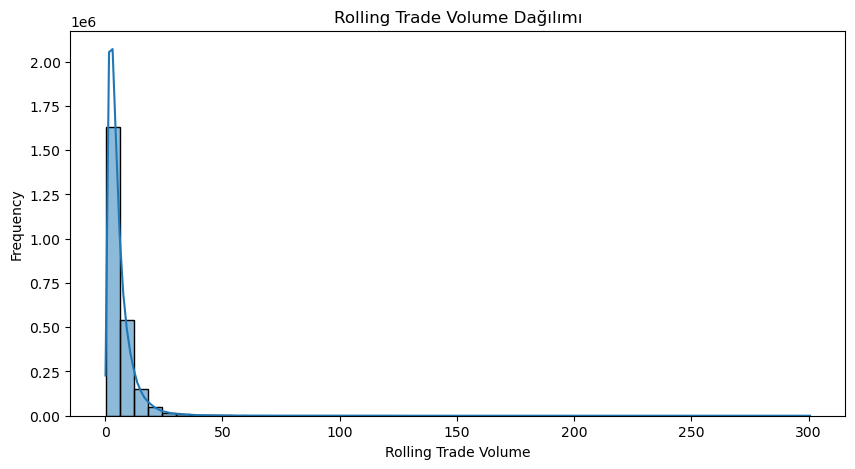

In [14]:
#Check rolling volume max value
plt.figure(figsize=(10,5))
sns.histplot(slippage_df['rolling_trade_volume'], bins=50, kde=True)
plt.xlabel("Rolling Trade Volume")
plt.ylabel("Frequency")
plt.title("Rolling Trade Volume Dağılımı")
plt.show()


In [15]:
print(slippage_df.nlargest(10, 'rolling_trade_volume'))

        trade_price  trade_quantity        trade_time_trade  is_market_maker  \
825482   82,000.000          51.608 2025-02-28 02:29:16.107                0   
825483   82,000.100           0.004 2025-02-28 02:29:16.119                0   
825485   82,001.200           0.008 2025-02-28 02:29:16.119                0   
825484   82,000.200           0.004 2025-02-28 02:29:16.119                0   
825486   82,002.000           0.002 2025-02-28 02:29:16.119                0   
825487   82,002.300           0.005 2025-02-28 02:29:16.119                0   
825488   82,002.800           0.002 2025-02-28 02:29:16.119                0   
825490   82,003.800           0.006 2025-02-28 02:29:16.119                0   
825489   82,003.600           0.004 2025-02-28 02:29:16.119                0   
825491   82,003.900           0.003 2025-02-28 02:29:16.119                0   

        bid_price  bid_quantity  ask_price  ask_quantity  \
825482 81,999.900        10.494 82,000.000        51.583   

**Some Graphs to Understand Metrics**

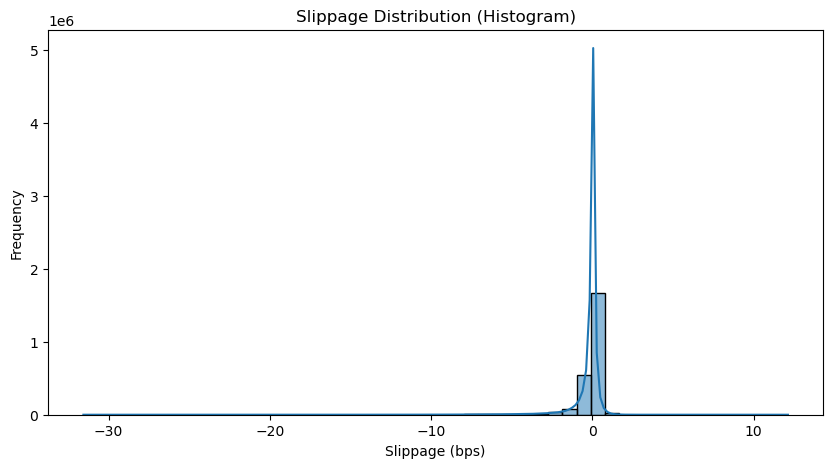

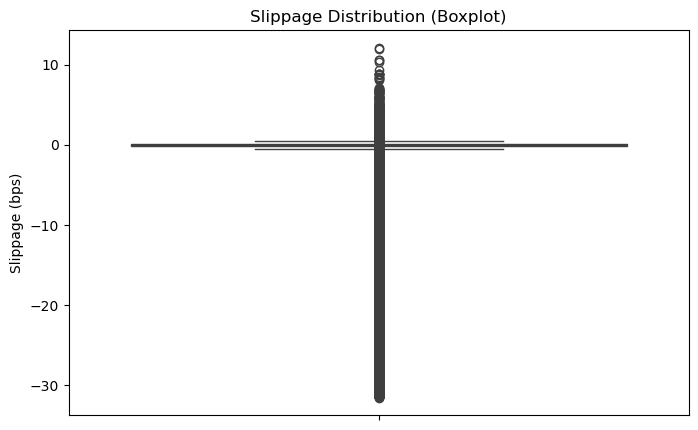

In [17]:
# Slippage Distribution Analysis
plt.figure(figsize=(10,5))
sns.histplot(slippage_df['slippage_bps'], bins=50, kde=True)
plt.xlabel("Slippage (bps)")
plt.ylabel("Frequency")
plt.title("Slippage Distribution (Histogram)")
plt.show()

plt.figure(figsize=(8,5))
sns.boxplot(y=slippage_df['slippage_bps'])
plt.ylabel("Slippage (bps)")
plt.title("Slippage Distribution (Boxplot)")
plt.show()

In [18]:
# Compute average slippage per second
slippage_df['trade_time_seconds'] = slippage_df['trade_time_trade'].dt.floor('S')
avg_slippage_per_sec = slippage_df.groupby('trade_time_seconds')['slippage_bps'].mean().reset_index()

# Interactive plot with Plotly
fig = px.line(avg_slippage_per_sec, x='trade_time_seconds', y='slippage_bps',
              title='Average Slippage Per Second', labels={'trade_time_seconds': 'Time (Seconds)', 'slippage_bps': 'Average Slippage (bps)'})
fig.show()

C:\Users\ciyab\AppData\Local\Temp\ipykernel_18376\234147919.py:2: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  slippage_df['trade_time_seconds'] = slippage_df['trade_time_trade'].dt.floor('S')


In [19]:
# Biggest negative slippage moments 
big_slippage_moments = slippage_df.nsmallest(10, "slippage_bps")
print(big_slippage_moments[['trade_price', 'trade_quantity', 'trade_time_trade',
                            'is_market_maker', 'slippage_bps',
                            'rolling_volatility', 'rolling_trade_volume', 
                            'tick_volume', 'avg_trade_size']])


        trade_price  trade_quantity        trade_time_trade  is_market_maker  \
424928   81,390.000           1.061 2025-02-28 01:33:28.919                1   
424927   81,390.300           0.099 2025-02-28 01:33:28.919                1   
424926   81,390.500           0.013 2025-02-28 01:33:28.919                1   
424925   81,390.700           0.072 2025-02-28 01:33:28.919                1   
424924   81,390.800           0.123 2025-02-28 01:33:28.919                1   
424923   81,391.000           2.210 2025-02-28 01:33:28.919                1   
424922   81,391.100           0.587 2025-02-28 01:33:28.919                1   
424921   81,391.200           0.095 2025-02-28 01:33:28.919                1   
424920   81,391.300           0.233 2025-02-28 01:33:28.919                1   
424919   81,391.400           0.172 2025-02-28 01:33:28.919                1   

        slippage_bps  rolling_volatility  rolling_trade_volume  tick_volume  \
424928       -31.564               0.252

C:\Users\ciyab\AppData\Local\Temp\ipykernel_18376\852572465.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




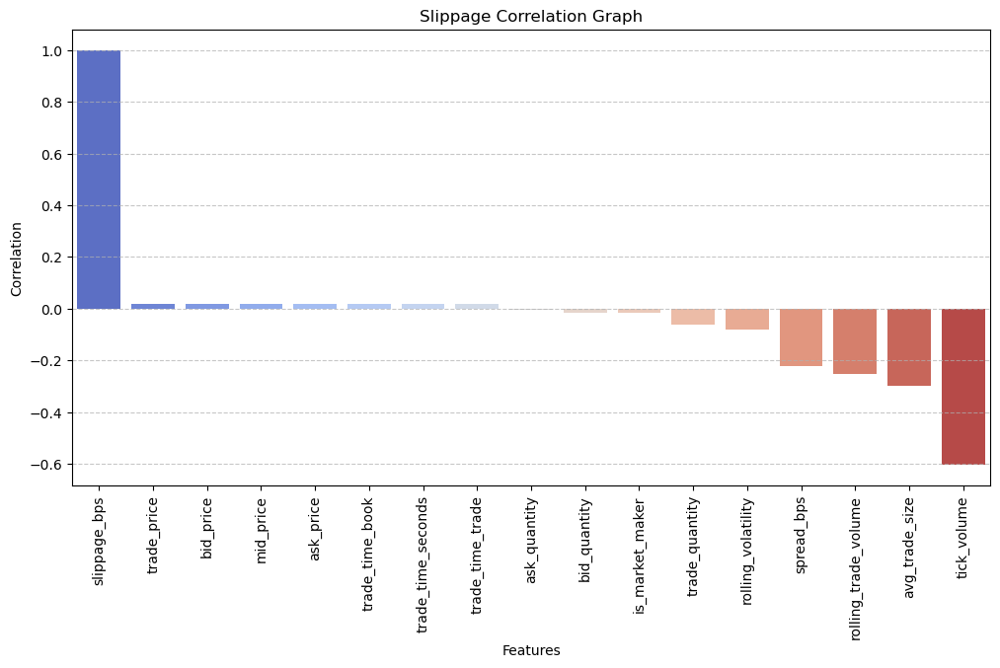

In [20]:
# Calculate the correlation matrix
correlation_matrix = slippage_df.corr()

# Extract correlation values for slippage_bps
slippage_corr = correlation_matrix["slippage_bps"].dropna().sort_values(ascending=False)

# Plot the correlation graph
plt.figure(figsize=(12, 6))
sns.barplot(x=slippage_corr.index, y=slippage_corr.values, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Slippage Correlation Graph")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

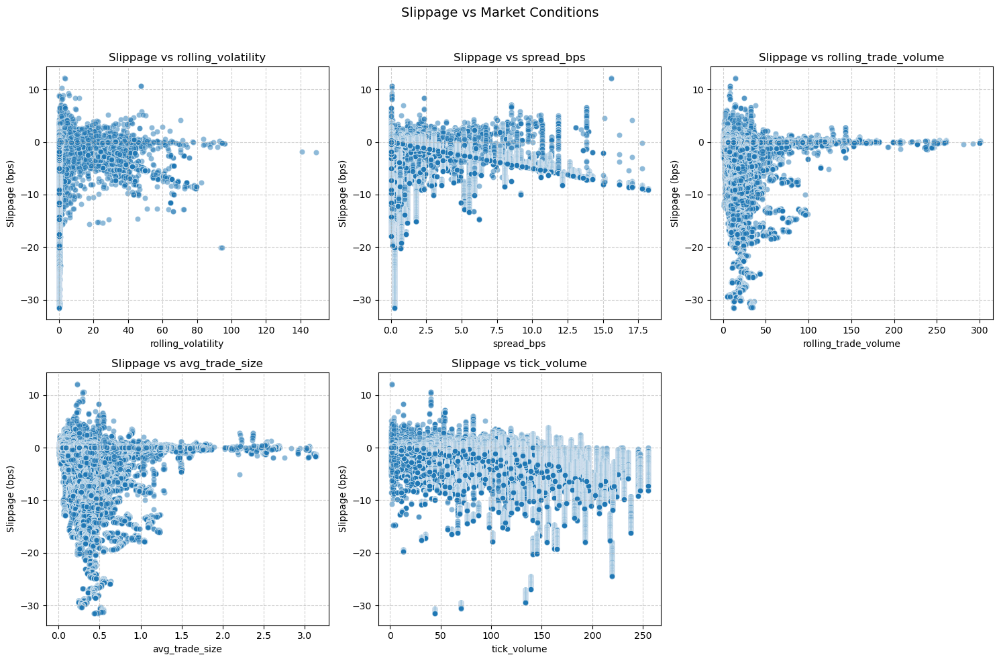

In [21]:
# Define the features to plot against slippage_bps
features = ["rolling_volatility", "spread_bps", "rolling_trade_volume" , "avg_trade_size" ,"tick_volume"]

# Set up the figure and axes for subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
fig.suptitle("Slippage vs Market Conditions", fontsize=14)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each feature against slippage_bps
for i, feature in enumerate(features):
    sns.scatterplot(x=slippage_df[feature], y=slippage_df["slippage_bps"], alpha=0.5, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Slippage (bps)")
    axes[i].set_title(f"Slippage vs {feature}")
    axes[i].grid(True, linestyle="--", alpha=0.6)

# Hide any unused subplot (since we created 6 but only need 5)
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plots
plt.show()


**Analysis of Big Slippage Values**

C:\Users\ciyab\AppData\Local\Temp\ipykernel_18376\2832042181.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




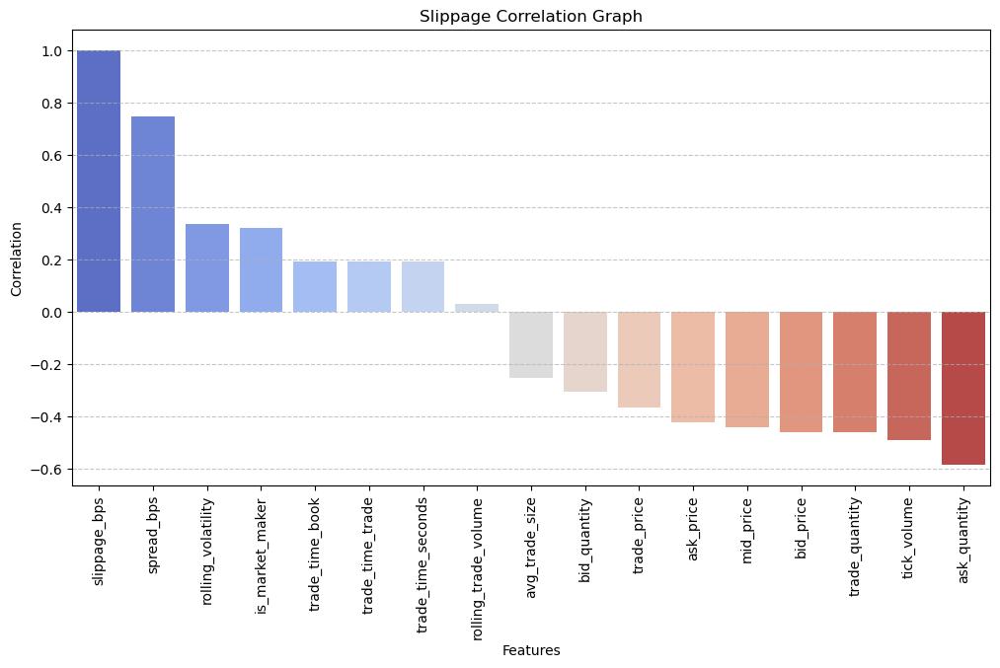

In [23]:
filtered_slippage_df_p = slippage_df[(slippage_df['slippage_bps'] >= 8)]
filtered_correlation_matrix_p = filtered_slippage_df_p.corr()
filtered_slippage_corr_p = filtered_correlation_matrix_p["slippage_bps"].dropna().sort_values(ascending=False)

# Plot the correlation graph
plt.figure(figsize=(12, 6))
sns.barplot(x=filtered_slippage_corr_p.index, y=filtered_slippage_corr_p.values, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Slippage Correlation Graph")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

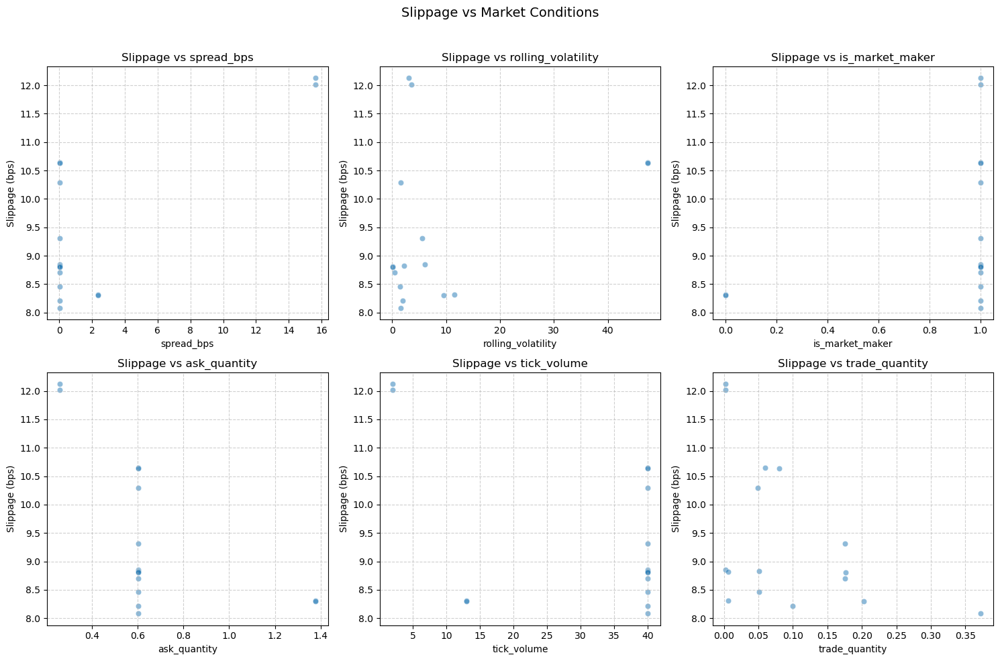

In [24]:
# Define the features to plot against slippage_bps
features = ["spread_bps","rolling_volatility", "is_market_maker",
            "ask_quantity","tick_volume","trade_quantity"]


# Set up the figure and axes for subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
fig.suptitle("Slippage vs Market Conditions", fontsize=14)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each feature against slippage_bps
for i, feature in enumerate(features):
    sns.scatterplot(x=filtered_slippage_df_p[feature], y=filtered_slippage_df_p["slippage_bps"], alpha=0.5, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Slippage (bps)")
    axes[i].set_title(f"Slippage vs {feature}")
    axes[i].grid(True, linestyle="--", alpha=0.6)

# Hide any unused subplot (since we created 6 but only need 5)
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plots
plt.show()


C:\Users\ciyab\AppData\Local\Temp\ipykernel_18376\3685275985.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




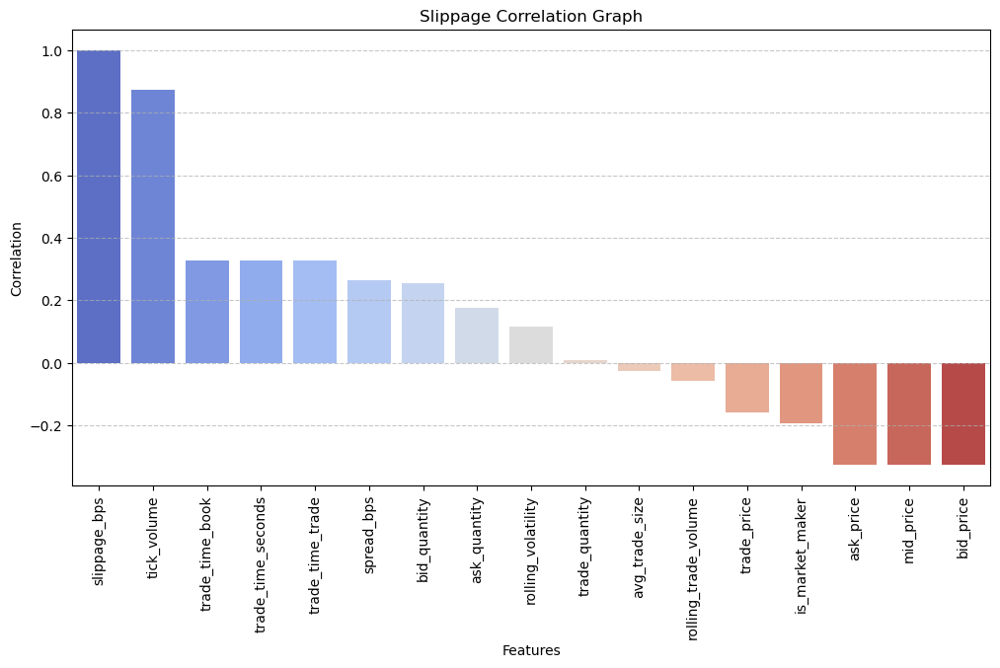

In [25]:
filtered_slippage_df_n = slippage_df[(slippage_df['slippage_bps'] <= -20)]
filtered_correlation_matrix_n = filtered_slippage_df_n.corr()
filtered_slippage_corr_n = filtered_correlation_matrix_n["slippage_bps"].dropna().sort_values(ascending=False)

# Plot the correlation graph
plt.figure(figsize=(12, 6))
sns.barplot(x=filtered_slippage_corr_n.index, y=filtered_slippage_corr_n.values, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Slippage Correlation Graph")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

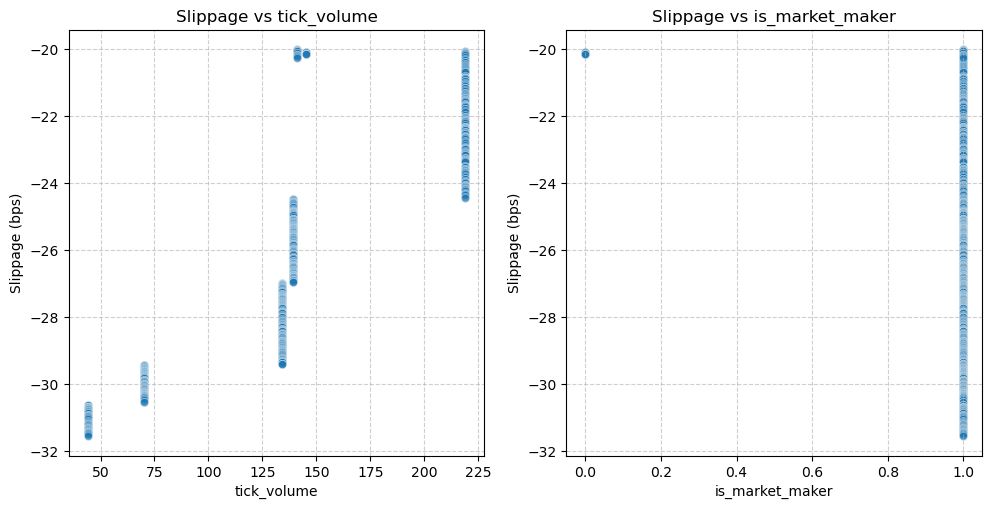

In [26]:
# Define the features to plot against slippage_bps
features = ["tick_volume","is_market_maker"]


# Set up the figure and axes for subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each feature against slippage_bps
for i, feature in enumerate(features):
    sns.scatterplot(x=filtered_slippage_df_n[feature], y=filtered_slippage_df_n["slippage_bps"], alpha=0.5, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Slippage (bps)")
    axes[i].set_title(f"Slippage vs {feature}")
    axes[i].grid(True, linestyle="--", alpha=0.6)

# Hide any unused subplot (since we created 6 but only need 5)
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plots
plt.show()
